# CT7160NI Computer Vision Coursework
## 03 - Model Evaluation & Performance Metrics

**Project:** Deep Learning-Based Plant Species Classification  
**Dataset:** Oxford 102 Flower Dataset  
**Author:** [Your Name]  
**Date:** [Date]

---

This notebook provides comprehensive evaluation of trained models (Baseline CNN and ResNet50), including performance metrics, visualizations, and inference examples.

### Contents
1. Setup and Imports
2. Configuration
3. Load Models
4. Evaluate Baseline CNN
5. Evaluate ResNet50
6. Model Comparison
7. Inference Examples
8. Summary

---

**Note:** This notebook evaluates models that have already been trained.


In [31]:
# Setup: Add project root to Python path
import sys
from pathlib import Path

# Try multiple strategies to find the project root
notebook_dir = Path().resolve()
project_root = None

# Strategy 1: If we're in notebooks/, parent is project root
if notebook_dir.name == 'notebooks' and (notebook_dir.parent / 'src').exists():
    project_root = notebook_dir.parent
# Strategy 2: Check if current directory is project root
elif (notebook_dir / 'src').exists():
    project_root = notebook_dir
# Strategy 3: Check parent directory
elif (notebook_dir.parent / 'src').exists():
    project_root = notebook_dir.parent
# Strategy 4: Walk up directory tree to find src
else:
    current = notebook_dir
    while current != current.parent:
        if (current / 'src').exists():
            project_root = current
            break
        current = current.parent

if project_root:
    if str(project_root) not in sys.path:
        sys.path.insert(0, str(project_root))
    print(f"✓ Project root found: {project_root}")
else:
    print("⚠ Warning: Could not find project root. Trying default path...")
    # Fallback: assume parent if in notebooks/
    if notebook_dir.name == 'notebooks':
        fallback = notebook_dir.parent
    else:
        fallback = notebook_dir
    if str(fallback) not in sys.path:
        sys.path.insert(0, str(fallback))
    print(f"✓ Using fallback path: {fallback}")


✓ Project root found: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification


In [32]:
# Import Libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from pathlib import Path
from PIL import Image
import time
import warnings
warnings.filterwarnings('ignore')

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

# Evaluation
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, roc_auc_score,
    roc_curve, top_k_accuracy_score
)
from sklearn.preprocessing import label_binarize

# Dataset and transforms
from src.data.dataset import FlowerDataset
from src.data.augmentation import get_val_transforms, AlbumentationsTransform
from src.data.data_loader import create_dataloaders

# Models
from src.models.baseline_cnn import BaselineCNN
from src.models.resnet_model import ResNetClassifier

# Evaluation utilities
from src.evaluation.metrics import get_predictions, calculate_metrics
from src.evaluation.visualization import (
    plot_confusion_matrix,
    plot_roc_curves,
    plot_per_class_performance
)

# Set style for plots
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 11

# Configuration
notebook_dir = Path().resolve()
if notebook_dir.name == 'notebooks':
    PROJECT_ROOT = notebook_dir.parent
else:
    PROJECT_ROOT = notebook_dir

DATA_DIR = PROJECT_ROOT / 'data/raw/oxford_flowers_102'
OUTPUT_DIR = PROJECT_ROOT / 'results/evaluation'
MODELS_DIR = PROJECT_ROOT / 'results/models'
FIGURES_DIR = PROJECT_ROOT / 'results/figures'

# Create output directories
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
FIGURES_DIR.mkdir(parents=True, exist_ok=True)

# Model paths
BASELINE_MODEL_PATH = MODELS_DIR / 'baseline_cnn_no_masks_best.pth'
RESNET50_MODEL_PATH = MODELS_DIR / 'resnet50_best.pth'

# Evaluation parameters
IMAGE_SIZE = 224
BATCH_SIZE = 32
NUM_WORKERS = 4
NUM_CLASSES = 102

# Device configuration
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"✓ Using device: {device}")
if device == 'cuda':
    print(f"✓ GPU: {torch.cuda.get_device_name(0)}")
    
print(f"✓ Project root: {PROJECT_ROOT}")
print(f"✓ Data directory: {DATA_DIR}")
print(f"✓ Models directory: {MODELS_DIR}")
print(f"✓ Output directory: {OUTPUT_DIR}")


✓ Using device: cuda
✓ GPU: NVIDIA GeForce RTX 2050
✓ Project root: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification
✓ Data directory: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\data\raw\oxford_flowers_102
✓ Models directory: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\models
✓ Output directory: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\evaluation


## 3. Load Models

Load the trained Baseline CNN and ResNet50 models from their checkpoints.


In [33]:
# Load Baseline CNN
print("Loading Baseline CNN model...")
if BASELINE_MODEL_PATH.exists():
    baseline_checkpoint = torch.load(BASELINE_MODEL_PATH, map_location=device, weights_only=False)
    baseline_model = BaselineCNN(num_classes=NUM_CLASSES, dropout=0.35, improved=False)
    baseline_model.load_state_dict(baseline_checkpoint['model_state_dict'])
    baseline_model.to(device)
    baseline_model.eval()
    
    baseline_params = sum(p.numel() for p in baseline_model.parameters())
    baseline_best_val_acc = baseline_checkpoint.get('best_val_acc', 0)
    print(f"✓ Baseline CNN loaded successfully")
    print(f"  Parameters: {baseline_params:,}")
    print(f"  Best validation accuracy (training): {baseline_best_val_acc:.2f}%")
else:
    print(f"⚠ Baseline CNN model not found at {BASELINE_MODEL_PATH}")
    baseline_model = None
    baseline_checkpoint = None


Loading Baseline CNN model...
✓ Baseline CNN loaded successfully
  Parameters: 1,866,918
  Best validation accuracy (training): 70.85%


In [34]:
# Load ResNet50
print("\nLoading ResNet50 model...")
if RESNET50_MODEL_PATH.exists():
    resnet50_checkpoint = torch.load(RESNET50_MODEL_PATH, map_location=device, weights_only=False)
    resnet50_model = ResNetClassifier(num_classes=NUM_CLASSES, pretrained=True, dropout=0.3)
    resnet50_model.load_state_dict(resnet50_checkpoint['model_state_dict'])
    resnet50_model.to(device)
    resnet50_model.eval()
    
    resnet50_params = sum(p.numel() for p in resnet50_model.parameters())
    resnet50_best_val_acc = resnet50_checkpoint.get('best_val_acc', 0)
    print(f"✓ ResNet50 loaded successfully")
    print(f"  Parameters: {resnet50_params:,}")
    print(f"  Best validation accuracy (training): {resnet50_best_val_acc:.2f}%")
else:
    print(f"⚠ ResNet50 model not found at {RESNET50_MODEL_PATH}")
    resnet50_model = None
    resnet50_checkpoint = None



Loading ResNet50 model...


Loaded ResNet50 with ImageNet pre-trained weights
Backbone layers frozen
✓ ResNet50 loaded successfully
  Parameters: 24,609,446
  Best validation accuracy (training): 98.78%


## 4. Prepare Test DataLoader

Create test DataLoader with validation transforms (no augmentation).


In [35]:
# Create test dataset and DataLoader
if DATA_DIR.exists():
    # Create validation transforms (no augmentation)
    val_transform = get_val_transforms(image_size=IMAGE_SIZE, use_albumentations=True)
    val_transform_wrapper = AlbumentationsTransform(val_transform)
    
    # Create test dataset
    test_dataset = FlowerDataset(
        root_dir=str(DATA_DIR),
        split='test',
        transform=val_transform_wrapper
    )
    
    # Create test DataLoader
    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS,
        pin_memory=True if torch.cuda.is_available() else False
    )
    
    print(f"✓ Test dataset created")
    print(f"  Test samples: {len(test_dataset):,}")
    print(f"  Test batches: {len(test_loader)}")
else:
    print(f"⚠ Data directory not found at {DATA_DIR}")
    test_dataset = None
    test_loader = None


✓ Test dataset created
  Test samples: 1,229
  Test batches: 39


## 5. Evaluate Baseline CNN

Get predictions and calculate comprehensive metrics for the Baseline CNN model.


In [36]:
# Evaluate Baseline CNN
if baseline_model is not None and test_loader is not None:
    print("=" * 80)
    print("BASELINE CNN EVALUATION")
    print("=" * 80)
    
    print("\nGetting predictions on test set...")
    start_time = time.time()
    baseline_results = get_predictions(baseline_model, test_loader, device=device)
    inference_time = time.time() - start_time
    
    print(f"✓ Inference completed in {inference_time:.2f} seconds")
    print(f"  Average inference time: {inference_time/len(test_dataset)*1000:.2f} ms/image")
    
    # Calculate metrics
    print("\nCalculating metrics...")
    baseline_metrics = calculate_metrics(
        predictions=baseline_results['predictions'],
        true_labels=baseline_results['true_labels'],
        probabilities=baseline_results['probabilities'],
        num_classes=NUM_CLASSES
    )
    
    print("\n" + "=" * 80)
    print("BASELINE CNN TEST SET RESULTS")
    print("=" * 80)
    print(f"Overall Accuracy: {baseline_metrics['accuracy']:.2f}%")
    if baseline_metrics.get('top_5_accuracy'):
        print(f"Top-5 Accuracy: {baseline_metrics['top_5_accuracy']:.2f}%")
    print(f"Precision (Macro): {baseline_metrics['precision_macro']:.2f}%")
    print(f"Precision (Micro): {baseline_metrics['precision_micro']:.2f}%")
    print(f"Recall (Macro): {baseline_metrics['recall_macro']:.2f}%")
    print(f"Recall (Micro): {baseline_metrics['recall_micro']:.2f}%")
    print(f"F1-Score (Macro): {baseline_metrics['f1_macro']:.2f}%")
    print(f"F1-Score (Micro): {baseline_metrics['f1_micro']:.2f}%")
    if baseline_metrics.get('roc_auc_macro'):
        print(f"ROC-AUC (Macro): {baseline_metrics['roc_auc_macro']:.4f}")
    print(f"\nTest Samples: {len(baseline_results['true_labels']):,}")
    print("=" * 80)
else:
    print("⚠ Cannot evaluate Baseline CNN: Model or test loader not available")
    baseline_results = None
    baseline_metrics = None


BASELINE CNN EVALUATION

Getting predictions on test set...


Getting predictions:   0%|          | 0/39 [00:00<?, ?it/s]

Getting predictions: 100%|██████████| 39/39 [00:39<00:00,  1.02s/it]


✓ Inference completed in 39.66 seconds
  Average inference time: 32.27 ms/image

Calculating metrics...

BASELINE CNN TEST SET RESULTS
Overall Accuracy: 70.79%
Top-5 Accuracy: 92.43%
Precision (Macro): 72.08%
Precision (Micro): 70.79%
Recall (Macro): 76.42%
Recall (Micro): 70.79%
F1-Score (Macro): 71.40%
F1-Score (Micro): 70.79%
ROC-AUC (Macro): 0.9915

Test Samples: 1,229


## 6. Evaluate ResNet50

Get predictions and calculate comprehensive metrics for the ResNet50 model.


In [37]:
# Evaluate ResNet50
if resnet50_model is not None and test_loader is not None:
    print("=" * 80)
    print("RESNET50 EVALUATION")
    print("=" * 80)
    
    print("\nGetting predictions on test set...")
    start_time = time.time()
    resnet50_results = get_predictions(resnet50_model, test_loader, device=device)
    inference_time = time.time() - start_time
    
    print(f"✓ Inference completed in {inference_time:.2f} seconds")
    print(f"  Average inference time: {inference_time/len(test_dataset)*1000:.2f} ms/image")
    
    # Calculate metrics
    print("\nCalculating metrics...")
    resnet50_metrics = calculate_metrics(
        predictions=resnet50_results['predictions'],
        true_labels=resnet50_results['true_labels'],
        probabilities=resnet50_results['probabilities'],
        num_classes=NUM_CLASSES
    )
    
    print("\n" + "=" * 80)
    print("RESNET50 TEST SET RESULTS")
    print("=" * 80)
    print(f"Overall Accuracy: {resnet50_metrics['accuracy']:.2f}%")
    if resnet50_metrics.get('top_5_accuracy'):
        print(f"Top-5 Accuracy: {resnet50_metrics['top_5_accuracy']:.2f}%")
    print(f"Precision (Macro): {resnet50_metrics['precision_macro']:.2f}%")
    print(f"Precision (Micro): {resnet50_metrics['precision_micro']:.2f}%")
    print(f"Recall (Macro): {resnet50_metrics['recall_macro']:.2f}%")
    print(f"Recall (Micro): {resnet50_metrics['recall_micro']:.2f}%")
    print(f"F1-Score (Macro): {resnet50_metrics['f1_macro']:.2f}%")
    print(f"F1-Score (Micro): {resnet50_metrics['f1_micro']:.2f}%")
    if resnet50_metrics.get('roc_auc_macro'):
        print(f"ROC-AUC (Macro): {resnet50_metrics['roc_auc_macro']:.4f}")
    print(f"\nTest Samples: {len(resnet50_results['true_labels']):,}")
    print("=" * 80)
else:
    print("⚠ Cannot evaluate ResNet50: Model or test loader not available")
    resnet50_results = None
    resnet50_metrics = None


RESNET50 EVALUATION

Getting predictions on test set...


Getting predictions: 100%|██████████| 39/39 [00:46<00:00,  1.19s/it]


✓ Inference completed in 46.25 seconds
  Average inference time: 37.63 ms/image

Calculating metrics...

RESNET50 TEST SET RESULTS
Overall Accuracy: 98.45%
Top-5 Accuracy: 99.76%
Precision (Macro): 98.45%
Precision (Micro): 98.45%
Recall (Macro): 98.16%
Recall (Micro): 98.45%
F1-Score (Macro): 98.20%
F1-Score (Micro): 98.45%
ROC-AUC (Macro): 0.9993

Test Samples: 1,229


## 7. Visualize Confusion Matrices

Generate confusion matrices for both models to visualize classification performance.


Generating Baseline CNN confusion matrix...
✓ Saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\confusion_matrix_baseline.png
  Overall Accuracy: 70.79%


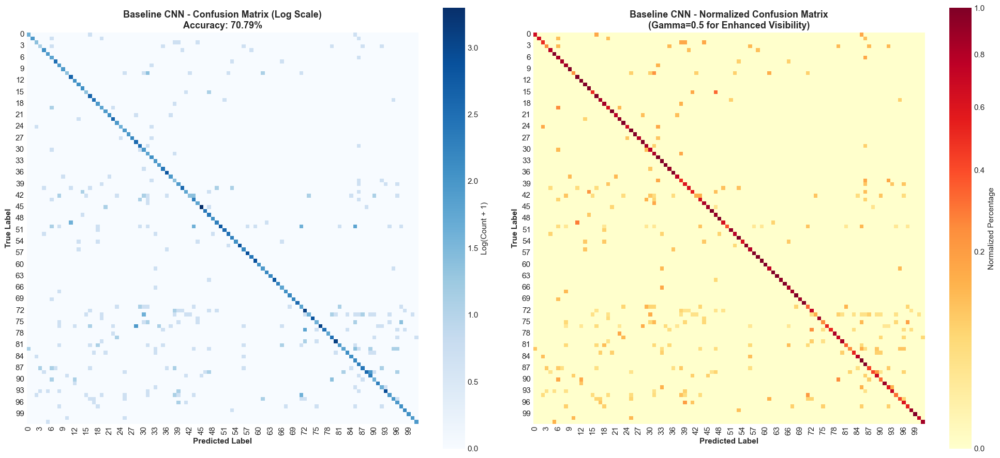

In [38]:
# Plot confusion matrices
if baseline_metrics is not None:
    print("Generating Baseline CNN confusion matrix...")
    cm_baseline = baseline_metrics['confusion_matrix']
    
    # Calculate accuracy metrics
    correct = np.trace(cm_baseline)
    total = cm_baseline.sum()
    accuracy = (correct / total) * 100
    
    # Normalize confusion matrix
    cm_normalized = cm_baseline.astype('float') / cm_baseline.sum(axis=1)[:, np.newaxis]
    cm_normalized = np.nan_to_num(cm_normalized)
    
    # Create figure with better visualization
    fig, axes = plt.subplots(1, 2, figsize=(20, 9))
    
    # Left: Unnormalized (raw counts) - use log scale for better visibility
    cm_log = np.log1p(cm_baseline)  # log(1+x) to handle zeros
    sns.heatmap(
        cm_log,
        annot=False,
        fmt='.2f',
        cmap='Blues',
        square=True,
        ax=axes[0],
        cbar_kws={'label': 'Log(Count + 1)'},
        vmin=0,
        vmax=cm_log.max()
    )
    axes[0].set_xlabel('Predicted Label', fontsize=11, fontweight='bold')
    axes[0].set_ylabel('True Label', fontsize=11, fontweight='bold')
    axes[0].set_title(f'Baseline CNN - Confusion Matrix (Log Scale)\nAccuracy: {accuracy:.2f}%', 
                      fontsize=13, fontweight='bold')
    
    # Right: Normalized with adjusted scale to show misclassifications better
    im = sns.heatmap(
        cm_normalized,
        annot=False,
        fmt='.3f',
        cmap='YlOrRd',  # Yellow-Orange-Red for better contrast
        square=True,
        ax=axes[1],
        cbar_kws={'label': 'Normalized Percentage'},
        vmin=0,
        vmax=1.0,
        # Use a custom normalization to emphasize misclassifications
        norm=mcolors.PowerNorm(gamma=0.5, vmin=0, vmax=1.0)  # Square root normalization
    )
    axes[1].set_xlabel('Predicted Label', fontsize=11, fontweight='bold')
    axes[1].set_ylabel('True Label', fontsize=11, fontweight='bold')
    axes[1].set_title(f'Baseline CNN - Normalized Confusion Matrix\n(Gamma=0.5 for Enhanced Visibility)', 
                      fontsize=13, fontweight='bold')
    
    plt.tight_layout()
    save_path = FIGURES_DIR / 'confusion_matrix_baseline.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Saved to {save_path}")
    print(f"  Overall Accuracy: {accuracy:.2f}%")
    plt.show()
else:
    print("⚠ Baseline CNN metrics not available for confusion matrix")


Generating ResNet50 confusion matrix...
✓ Saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\confusion_matrix_resnet50.png
  Overall Accuracy: 98.45%


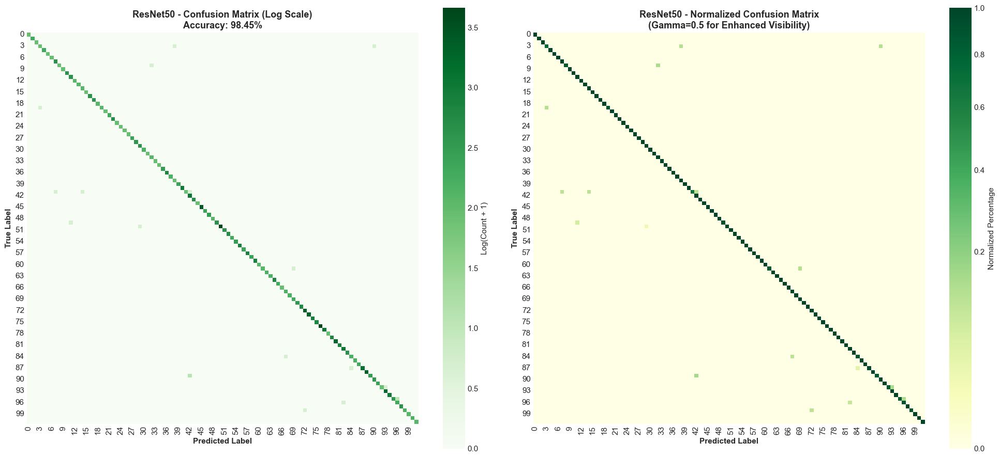

In [39]:
# Plot ResNet50 confusion matrix
if resnet50_metrics is not None:
    print("Generating ResNet50 confusion matrix...")
    cm_resnet50 = resnet50_metrics['confusion_matrix']
    
    # Calculate accuracy metrics
    correct = np.trace(cm_resnet50)
    total = cm_resnet50.sum()
    accuracy = (correct / total) * 100
    
    # Normalize confusion matrix
    cm_normalized = cm_resnet50.astype('float') / cm_resnet50.sum(axis=1)[:, np.newaxis]
    cm_normalized = np.nan_to_num(cm_normalized)
    
    # Create figure with better visualization
    fig, axes = plt.subplots(1, 2, figsize=(20, 9))
    
    # Left: Unnormalized (raw counts) - use log scale for better visibility
    cm_log = np.log1p(cm_resnet50)  # log(1+x) to handle zeros
    sns.heatmap(
        cm_log,
        annot=False,
        fmt='.2f',
        cmap='Greens',
        square=True,
        ax=axes[0],
        cbar_kws={'label': 'Log(Count + 1)'},
        vmin=0,
        vmax=cm_log.max()
    )
    axes[0].set_xlabel('Predicted Label', fontsize=11, fontweight='bold')
    axes[0].set_ylabel('True Label', fontsize=11, fontweight='bold')
    axes[0].set_title(f'ResNet50 - Confusion Matrix (Log Scale)\nAccuracy: {accuracy:.2f}%', 
                      fontsize=13, fontweight='bold')
    
    # Right: Normalized with adjusted scale to show misclassifications better
    im = sns.heatmap(
        cm_normalized,
        annot=False,
        fmt='.3f',
        cmap='YlGn',  # Yellow-Green for better contrast
        square=True,
        ax=axes[1],
        cbar_kws={'label': 'Normalized Percentage'},
        vmin=0,
        vmax=1.0,
        # Use a custom normalization to emphasize misclassifications
        norm=mcolors.PowerNorm(gamma=0.5, vmin=0, vmax=1.0)  # Square root normalization
    )
    axes[1].set_xlabel('Predicted Label', fontsize=11, fontweight='bold')
    axes[1].set_ylabel('True Label', fontsize=11, fontweight='bold')
    axes[1].set_title(f'ResNet50 - Normalized Confusion Matrix\n(Gamma=0.5 for Enhanced Visibility)', 
                      fontsize=13, fontweight='bold')
    
    plt.tight_layout()
    save_path = FIGURES_DIR / 'confusion_matrix_resnet50.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Saved to {save_path}")
    print(f"  Overall Accuracy: {accuracy:.2f}%")
    plt.show()
else:
    print("⚠ ResNet50 metrics not available for confusion matrix")


## 8. ROC Curves

Generate ROC curves for top-performing classes.


Generating Baseline CNN ROC curves...
✓ Saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\roc_curves_baseline.png
  Mean AUC: 0.9915
  Median AUC: 0.9989
  Min AUC: 0.9256
  Max AUC: 1.0000


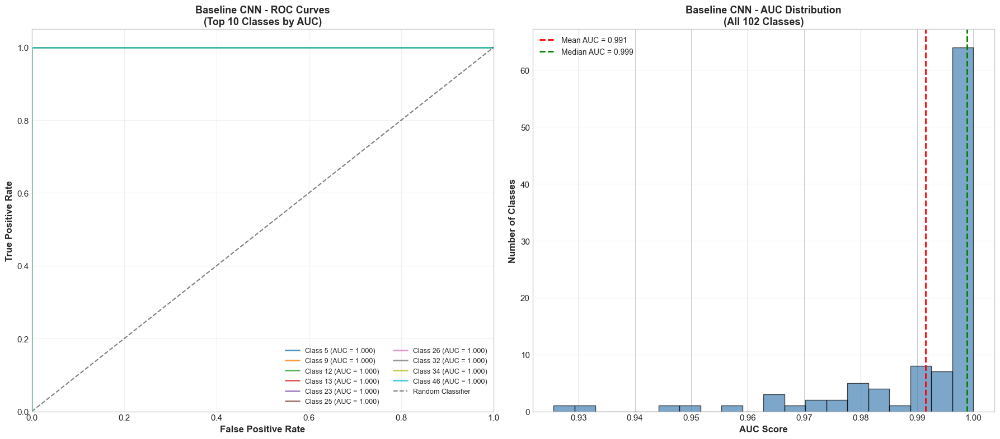

In [40]:
# Plot ROC curves for Baseline CNN
if baseline_results is not None and baseline_metrics is not None:
    print("Generating Baseline CNN ROC curves...")
    
    from sklearn.metrics import roc_curve, auc
    from sklearn.preprocessing import label_binarize
    
    true_labels = baseline_results['true_labels']
    probabilities = baseline_results['probabilities']
    num_classes = probabilities.shape[1]
    
    # Binarize labels for multi-class ROC
    y_bin = label_binarize(true_labels, classes=range(num_classes))
    
    # Calculate ROC for each class
    fpr = {}
    tpr = {}
    roc_auc = {}
    
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], probabilities[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    # Get top-10 classes by AUC for better visualization
    top_classes = sorted(roc_auc.keys(), key=lambda x: roc_auc[x], reverse=True)[:10]
    
    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    
    # Left: Top classes ROC curves
    colors = plt.cm.tab10(np.linspace(0, 1, len(top_classes)))
    for idx, cls in enumerate(top_classes):
        axes[0].plot(
            fpr[cls], tpr[cls],
            color=colors[idx],
            linewidth=2,
            label=f'Class {cls} (AUC = {roc_auc[cls]:.3f})',
            alpha=0.8
        )
    
    axes[0].plot([0, 1], [0, 1], 'k--', linewidth=1.5, alpha=0.5, label='Random Classifier')
    axes[0].set_xlim([0.0, 1.0])
    axes[0].set_ylim([0.0, 1.05])
    axes[0].set_xlabel('False Positive Rate', fontsize=12, fontweight='bold')
    axes[0].set_ylabel('True Positive Rate', fontsize=12, fontweight='bold')
    axes[0].set_title(f'Baseline CNN - ROC Curves\n(Top 10 Classes by AUC)', 
                      fontsize=13, fontweight='bold')
    axes[0].legend(loc='lower right', fontsize=9, ncol=2)
    axes[0].grid(True, alpha=0.3)
    
    # Right: AUC distribution histogram
    all_aucs = list(roc_auc.values())
    axes[1].hist(all_aucs, bins=20, color='steelblue', edgecolor='black', alpha=0.7)
    axes[1].axvline(np.mean(all_aucs), color='red', linestyle='--', linewidth=2, 
                    label=f'Mean AUC = {np.mean(all_aucs):.3f}')
    axes[1].axvline(np.median(all_aucs), color='green', linestyle='--', linewidth=2, 
                    label=f'Median AUC = {np.median(all_aucs):.3f}')
    axes[1].set_xlabel('AUC Score', fontsize=12, fontweight='bold')
    axes[1].set_ylabel('Number of Classes', fontsize=12, fontweight='bold')
    axes[1].set_title('Baseline CNN - AUC Distribution\n(All 102 Classes)', 
                      fontsize=13, fontweight='bold')
    axes[1].legend(fontsize=10)
    axes[1].grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    save_path = FIGURES_DIR / 'roc_curves_baseline.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Saved to {save_path}")
    print(f"  Mean AUC: {np.mean(all_aucs):.4f}")
    print(f"  Median AUC: {np.median(all_aucs):.4f}")
    print(f"  Min AUC: {np.min(all_aucs):.4f}")
    print(f"  Max AUC: {np.max(all_aucs):.4f}")
    plt.show()
else:
    print("⚠ Baseline CNN results not available for ROC curves")


Generating ResNet50 ROC curves...
✓ Saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\roc_curves_resnet50.png
  Mean AUC: 0.9993
  Median AUC: 1.0000
  Min AUC: 0.9362
  Max AUC: 1.0000


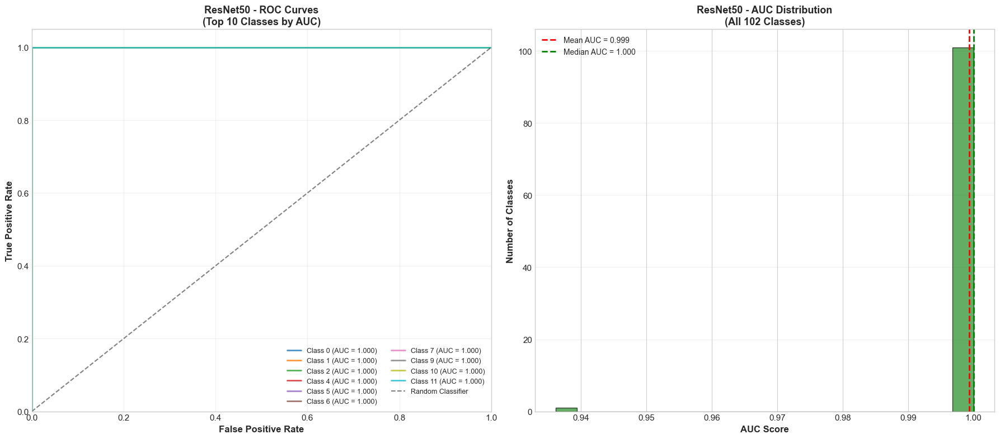

In [41]:
# Plot ROC curves for ResNet50
if resnet50_results is not None and resnet50_metrics is not None:
    print("Generating ResNet50 ROC curves...")
    
    from sklearn.metrics import roc_curve, auc
    from sklearn.preprocessing import label_binarize
    
    true_labels = resnet50_results['true_labels']
    probabilities = resnet50_results['probabilities']
    num_classes = probabilities.shape[1]
    
    # Binarize labels for multi-class ROC
    y_bin = label_binarize(true_labels, classes=range(num_classes))
    
    # Calculate ROC for each class
    fpr = {}
    tpr = {}
    roc_auc = {}
    
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], probabilities[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    # Get top-10 classes by AUC for better visualization
    top_classes = sorted(roc_auc.keys(), key=lambda x: roc_auc[x], reverse=True)[:10]
    
    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    
    # Left: Top classes ROC curves
    colors = plt.cm.tab10(np.linspace(0, 1, len(top_classes)))
    for idx, cls in enumerate(top_classes):
        axes[0].plot(
            fpr[cls], tpr[cls],
            color=colors[idx],
            linewidth=2,
            label=f'Class {cls} (AUC = {roc_auc[cls]:.3f})',
            alpha=0.8
        )
    
    axes[0].plot([0, 1], [0, 1], 'k--', linewidth=1.5, alpha=0.5, label='Random Classifier')
    axes[0].set_xlim([0.0, 1.0])
    axes[0].set_ylim([0.0, 1.05])
    axes[0].set_xlabel('False Positive Rate', fontsize=12, fontweight='bold')
    axes[0].set_ylabel('True Positive Rate', fontsize=12, fontweight='bold')
    axes[0].set_title(f'ResNet50 - ROC Curves\n(Top 10 Classes by AUC)', 
                      fontsize=13, fontweight='bold')
    axes[0].legend(loc='lower right', fontsize=9, ncol=2)
    axes[0].grid(True, alpha=0.3)
    
    # Right: AUC distribution histogram
    all_aucs = list(roc_auc.values())
    axes[1].hist(all_aucs, bins=20, color='forestgreen', edgecolor='black', alpha=0.7)
    axes[1].axvline(np.mean(all_aucs), color='red', linestyle='--', linewidth=2, 
                    label=f'Mean AUC = {np.mean(all_aucs):.3f}')
    axes[1].axvline(np.median(all_aucs), color='green', linestyle='--', linewidth=2, 
                    label=f'Median AUC = {np.median(all_aucs):.3f}')
    axes[1].set_xlabel('AUC Score', fontsize=12, fontweight='bold')
    axes[1].set_ylabel('Number of Classes', fontsize=12, fontweight='bold')
    axes[1].set_title('ResNet50 - AUC Distribution\n(All 102 Classes)', 
                      fontsize=13, fontweight='bold')
    axes[1].legend(fontsize=10)
    axes[1].grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    save_path = FIGURES_DIR / 'roc_curves_resnet50.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Saved to {save_path}")
    print(f"  Mean AUC: {np.mean(all_aucs):.4f}")
    print(f"  Median AUC: {np.median(all_aucs):.4f}")
    print(f"  Min AUC: {np.min(all_aucs):.4f}")
    print(f"  Max AUC: {np.max(all_aucs):.4f}")
    plt.show()
else:
    print("⚠ ResNet50 results not available for ROC curves")


## 9. Per-Class Performance

Visualize per-class F1-scores to identify best and worst performing classes.


Generating Baseline CNN per-class performance...
Per-class performance saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\per_class_performance_baseline.png


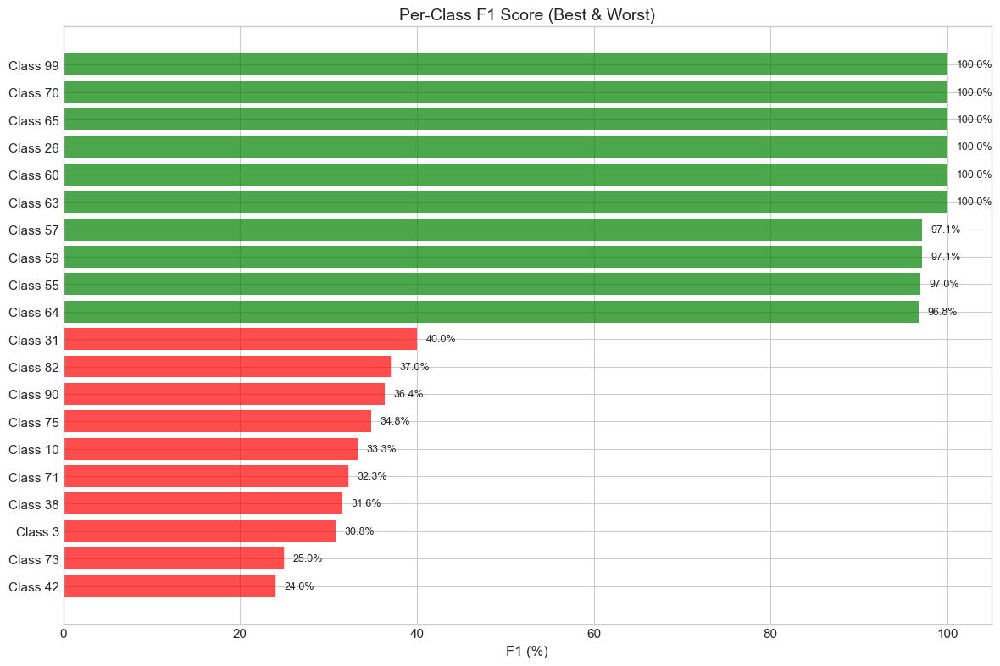

In [42]:
# Plot per-class performance for Baseline CNN
if baseline_metrics is not None:
    print("Generating Baseline CNN per-class performance...")
    plot_per_class_performance(
        metrics=baseline_metrics,
        metric='f1',
        top_k=20,
        save_path=str(FIGURES_DIR / 'per_class_performance_baseline.png')
    )
else:
    print("⚠ Baseline CNN metrics not available for per-class performance")


Generating ResNet50 per-class performance...
Per-class performance saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\per_class_performance_resnet50.png


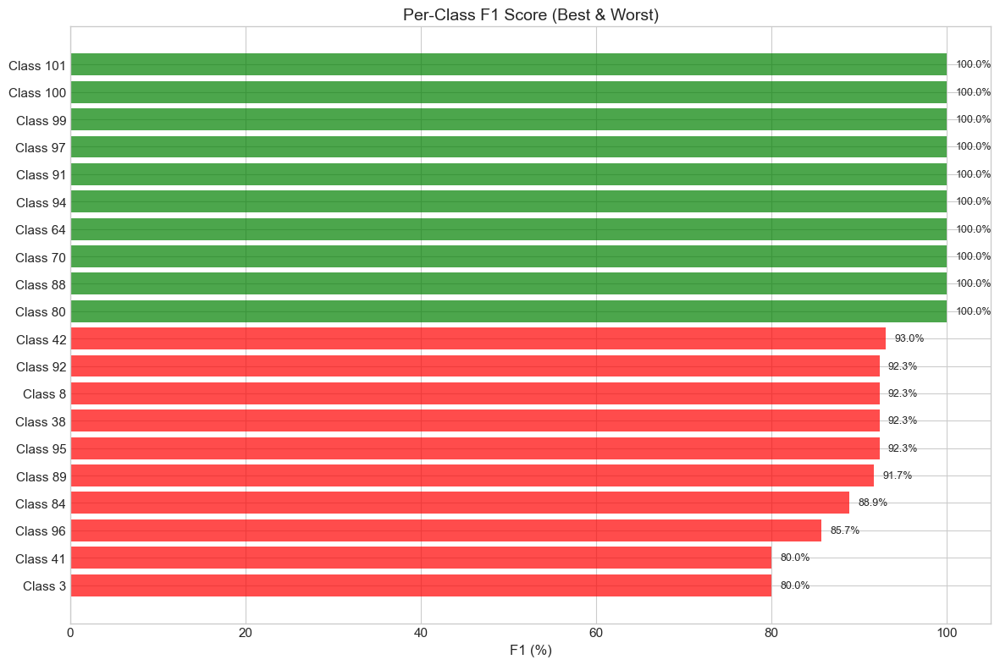

In [43]:
# Plot per-class performance for ResNet50
if resnet50_metrics is not None:
    print("Generating ResNet50 per-class performance...")
    plot_per_class_performance(
        metrics=resnet50_metrics,
        metric='f1',
        top_k=20,
        save_path=str(FIGURES_DIR / 'per_class_performance_resnet50.png')
    )
else:
    print("⚠ ResNet50 metrics not available for per-class performance")


## 10. Model Comparison

Create a comprehensive comparison of both models.


In [44]:
# Create comparison DataFrame
if baseline_metrics is not None and resnet50_metrics is not None:
    comparison_data = {
        'Metric': [
            'Overall Accuracy (%)',
            'Top-5 Accuracy (%)',
            'Precision (Macro) (%)',
            'Precision (Micro) (%)',
            'Recall (Macro) (%)',
            'Recall (Micro) (%)',
            'F1-Score (Macro) (%)',
            'F1-Score (Micro) (%)',
            'ROC-AUC (Macro)',
            'Model Parameters',
            'Best Val Acc (Training) (%)'
        ],
        'Baseline CNN': [
            f"{baseline_metrics['accuracy']:.2f}",
            f"{baseline_metrics.get('top_5_accuracy', 'N/A'):.2f}" if baseline_metrics.get('top_5_accuracy') else 'N/A',
            f"{baseline_metrics['precision_macro']:.2f}",
            f"{baseline_metrics['precision_micro']:.2f}",
            f"{baseline_metrics['recall_macro']:.2f}",
            f"{baseline_metrics['recall_micro']:.2f}",
            f"{baseline_metrics['f1_macro']:.2f}",
            f"{baseline_metrics['f1_micro']:.2f}",
            f"{baseline_metrics.get('roc_auc_macro', 'N/A'):.4f}" if baseline_metrics.get('roc_auc_macro') else 'N/A',
            f"{baseline_params:,}",
            f"{baseline_best_val_acc:.2f}"
        ],
        'ResNet50': [
            f"{resnet50_metrics['accuracy']:.2f}",
            f"{resnet50_metrics.get('top_5_accuracy', 'N/A'):.2f}" if resnet50_metrics.get('top_5_accuracy') else 'N/A',
            f"{resnet50_metrics['precision_macro']:.2f}",
            f"{resnet50_metrics['precision_micro']:.2f}",
            f"{resnet50_metrics['recall_macro']:.2f}",
            f"{resnet50_metrics['recall_micro']:.2f}",
            f"{resnet50_metrics['f1_macro']:.2f}",
            f"{resnet50_metrics['f1_micro']:.2f}",
            f"{resnet50_metrics.get('roc_auc_macro', 'N/A'):.4f}" if resnet50_metrics.get('roc_auc_macro') else 'N/A',
            f"{resnet50_params:,}",
            f"{resnet50_best_val_acc:.2f}"
        ]
    }
    
    comparison_df = pd.DataFrame(comparison_data)
    print("=" * 80)
    print("MODEL COMPARISON - TEST SET PERFORMANCE")
    print("=" * 80)
    print(comparison_df.to_string(index=False))
    print("=" * 80)
else:
    print("⚠ Both models must be evaluated for comparison")


MODEL COMPARISON - TEST SET PERFORMANCE
                     Metric Baseline CNN   ResNet50
       Overall Accuracy (%)        70.79      98.45
         Top-5 Accuracy (%)        92.43      99.76
      Precision (Macro) (%)        72.08      98.45
      Precision (Micro) (%)        70.79      98.45
         Recall (Macro) (%)        76.42      98.16
         Recall (Micro) (%)        70.79      98.45
       F1-Score (Macro) (%)        71.40      98.20
       F1-Score (Micro) (%)        70.79      98.45
            ROC-AUC (Macro)       0.9915     0.9993
           Model Parameters    1,866,918 24,609,446
Best Val Acc (Training) (%)        70.85      98.78


## 11. Inference Examples

Demonstrate model inference on sample images from the test set.


Demonstrating inference on sample test images...
✓ Saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\inference_examples_baseline.png


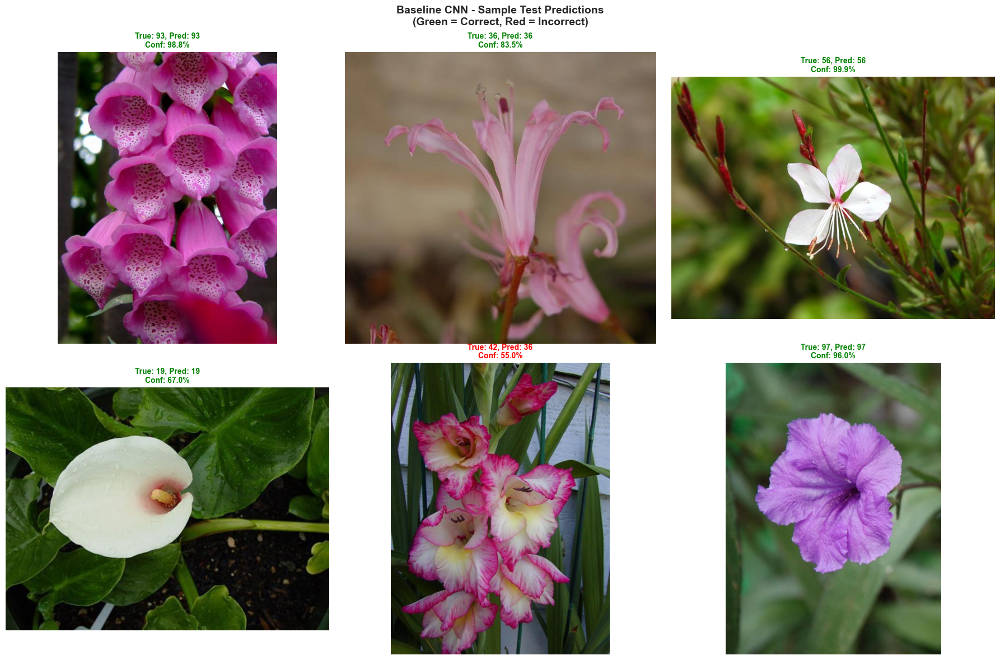

In [45]:
# Function to predict on a single image
def predict_image(model, image_path, transform, device, model_name="Model"):
    """Predict class for a single image."""
    if model is None:
        return None
    
    model.eval()
    
    # Load and preprocess image
    image = Image.open(image_path).convert('RGB')
    original_image = image.copy()
    image_tensor = transform(image).unsqueeze(0).to(device)
    
    # Get prediction
    with torch.no_grad():
        outputs = model(image_tensor)
        probabilities = F.softmax(outputs, dim=1)
        top_probs, top_indices = torch.topk(probabilities, k=5, dim=1)
    
    return {
        'image': original_image,
        'top_classes': top_indices[0].cpu().numpy(),
        'top_probs': top_probs[0].cpu().numpy(),
        'predicted_class': top_indices[0][0].item(),
        'confidence': top_probs[0][0].item()
    }

# Visualize predictions on sample images
if test_dataset is not None and baseline_model is not None:
    print("Demonstrating inference on sample test images...")
    
    # Get a few sample images from test set
    num_samples = 6
    sample_indices = np.random.choice(len(test_dataset), num_samples, replace=False)
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    val_transform = get_val_transforms(image_size=IMAGE_SIZE, use_albumentations=True)
    val_transform_wrapper = AlbumentationsTransform(val_transform)
    
    for idx, sample_idx in enumerate(sample_indices):
        image_path = test_dataset.image_paths[sample_idx]
        true_label = test_dataset.labels[sample_idx]
        
        # Get predictions from both models
        baseline_pred = predict_image(baseline_model, image_path, val_transform_wrapper, device, "Baseline")
        
        # Load and display image
        image = Image.open(image_path).convert('RGB')
        axes[idx].imshow(image)
        
        # Add title with predictions
        if baseline_pred:
            pred_class = baseline_pred['predicted_class']
            confidence = baseline_pred['confidence'] * 100
            title = f'True: {true_label}, Pred: {pred_class}\nConf: {confidence:.1f}%'
            color = 'green' if pred_class == true_label else 'red'
        else:
            title = f'True: {true_label}'
            color = 'black'
        
        axes[idx].set_title(title, fontsize=10, fontweight='bold', color=color)
        axes[idx].axis('off')
    
    plt.suptitle('Baseline CNN - Sample Test Predictions\n(Green = Correct, Red = Incorrect)', 
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    save_path = FIGURES_DIR / 'inference_examples_baseline.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Saved to {save_path}")
    plt.show()
else:
    print("⚠ Cannot demonstrate inference: Test dataset or model not available")


Demonstrating ResNet50 inference on sample test images...
✓ Saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\inference_examples_resnet50.png


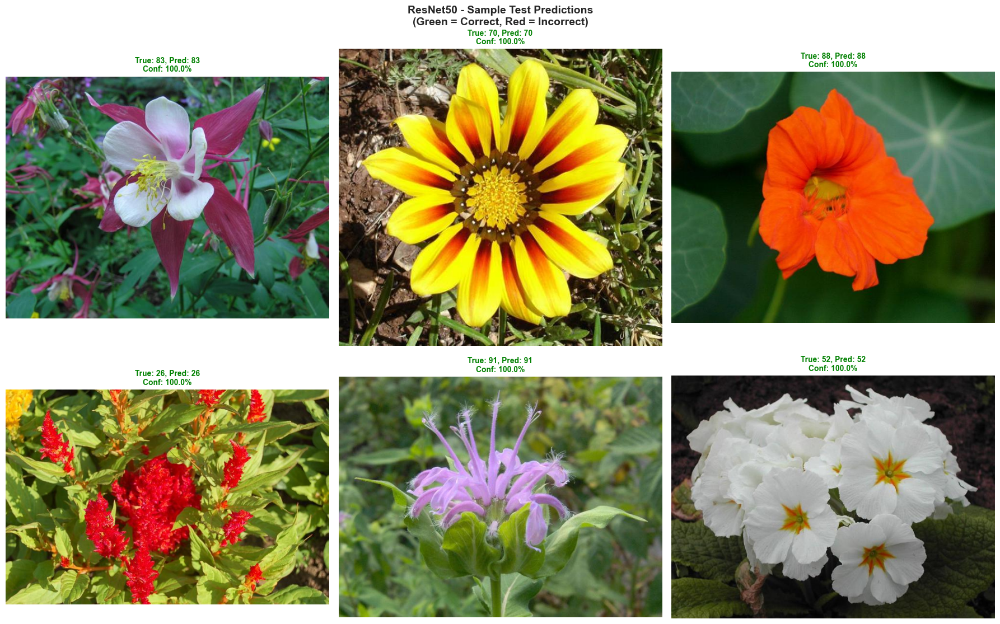

In [46]:
# Visualize ResNet50 predictions
if test_dataset is not None and resnet50_model is not None:
    print("Demonstrating ResNet50 inference on sample test images...")
    
    # Get a few sample images from test set
    num_samples = 6
    sample_indices = np.random.choice(len(test_dataset), num_samples, replace=False)
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    val_transform = get_val_transforms(image_size=IMAGE_SIZE, use_albumentations=True)
    val_transform_wrapper = AlbumentationsTransform(val_transform)
    
    for idx, sample_idx in enumerate(sample_indices):
        image_path = test_dataset.image_paths[sample_idx]
        true_label = test_dataset.labels[sample_idx]
        
        # Get predictions
        resnet50_pred = predict_image(resnet50_model, image_path, val_transform_wrapper, device, "ResNet50")
        
        # Load and display image
        image = Image.open(image_path).convert('RGB')
        axes[idx].imshow(image)
        
        # Add title with predictions
        if resnet50_pred:
            pred_class = resnet50_pred['predicted_class']
            confidence = resnet50_pred['confidence'] * 100
            title = f'True: {true_label}, Pred: {pred_class}\nConf: {confidence:.1f}%'
            color = 'green' if pred_class == true_label else 'red'
        else:
            title = f'True: {true_label}'
            color = 'black'
        
        axes[idx].set_title(title, fontsize=10, fontweight='bold', color=color)
        axes[idx].axis('off')
    
    plt.suptitle('ResNet50 - Sample Test Predictions\n(Green = Correct, Red = Incorrect)', 
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    save_path = FIGURES_DIR / 'inference_examples_resnet50.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Saved to {save_path}")
    plt.show()
else:
    print("⚠ Cannot demonstrate ResNet50 inference: Test dataset or model not available")


## 12. Misclassified Examples

Analyze misclassified examples to understand model weaknesses.


Analyzing Baseline CNN misclassifications...
Total misclassified: 359 / 1229
Error rate: 29.21%
✓ Saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\misclassified_examples_baseline.png


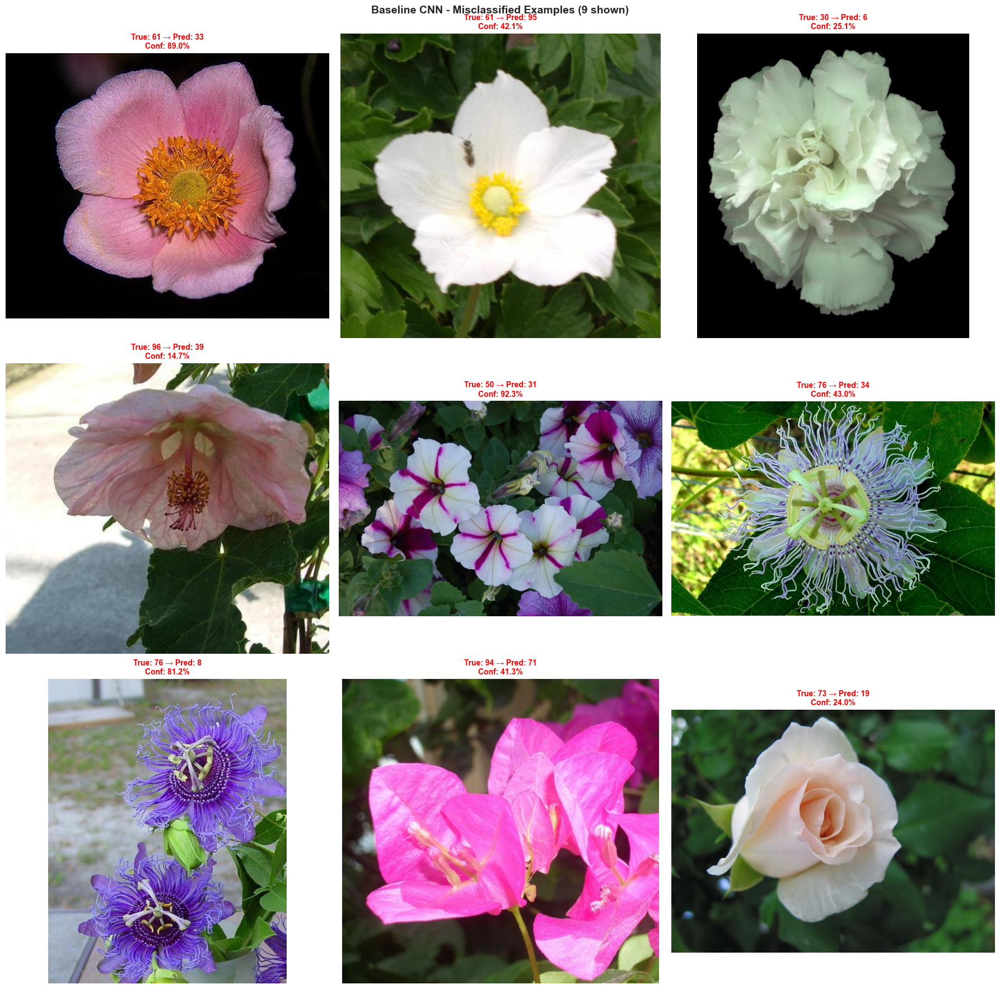

In [47]:
# Find and visualize misclassified examples for Baseline CNN
if baseline_results is not None and test_dataset is not None:
    print("Analyzing Baseline CNN misclassifications...")
    
    # Find misclassified examples
    misclassified_mask = baseline_results['predictions'] != baseline_results['true_labels']
    misclassified_indices = np.where(misclassified_mask)[0]
    
    print(f"Total misclassified: {len(misclassified_indices)} / {len(baseline_results['true_labels'])}")
    print(f"Error rate: {len(misclassified_indices)/len(baseline_results['true_labels'])*100:.2f}%")
    
    # Visualize some misclassified examples
    num_examples = min(9, len(misclassified_indices))
    if num_examples > 0:
        selected_indices = np.random.choice(misclassified_indices, num_examples, replace=False)
        
        fig, axes = plt.subplots(3, 3, figsize=(18, 18))
        axes = axes.flatten()
        
        for idx, mis_idx in enumerate(selected_indices):
            image_path = test_dataset.image_paths[mis_idx]
            true_label = baseline_results['true_labels'][mis_idx]
            pred_label = baseline_results['predictions'][mis_idx]
            confidence = baseline_results['probabilities'][mis_idx][pred_label] * 100
            
            image = Image.open(image_path).convert('RGB')
            axes[idx].imshow(image)
            axes[idx].set_title(f'True: {true_label} → Pred: {pred_label}\nConf: {confidence:.1f}%', 
                              fontsize=10, fontweight='bold', color='red')
            axes[idx].axis('off')
        
        plt.suptitle(f'Baseline CNN - Misclassified Examples ({num_examples} shown)', 
                     fontsize=14, fontweight='bold')
        plt.tight_layout()
        save_path = FIGURES_DIR / 'misclassified_examples_baseline.png'
        plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✓ Saved to {save_path}")
        plt.show()
    else:
        print("✓ No misclassified examples found!")
else:
    print("⚠ Cannot analyze misclassifications: Results or dataset not available")


Analyzing ResNet50 misclassifications...
Total misclassified: 19 / 1229
Error rate: 1.55%
✓ Saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\misclassified_examples_resnet50.png


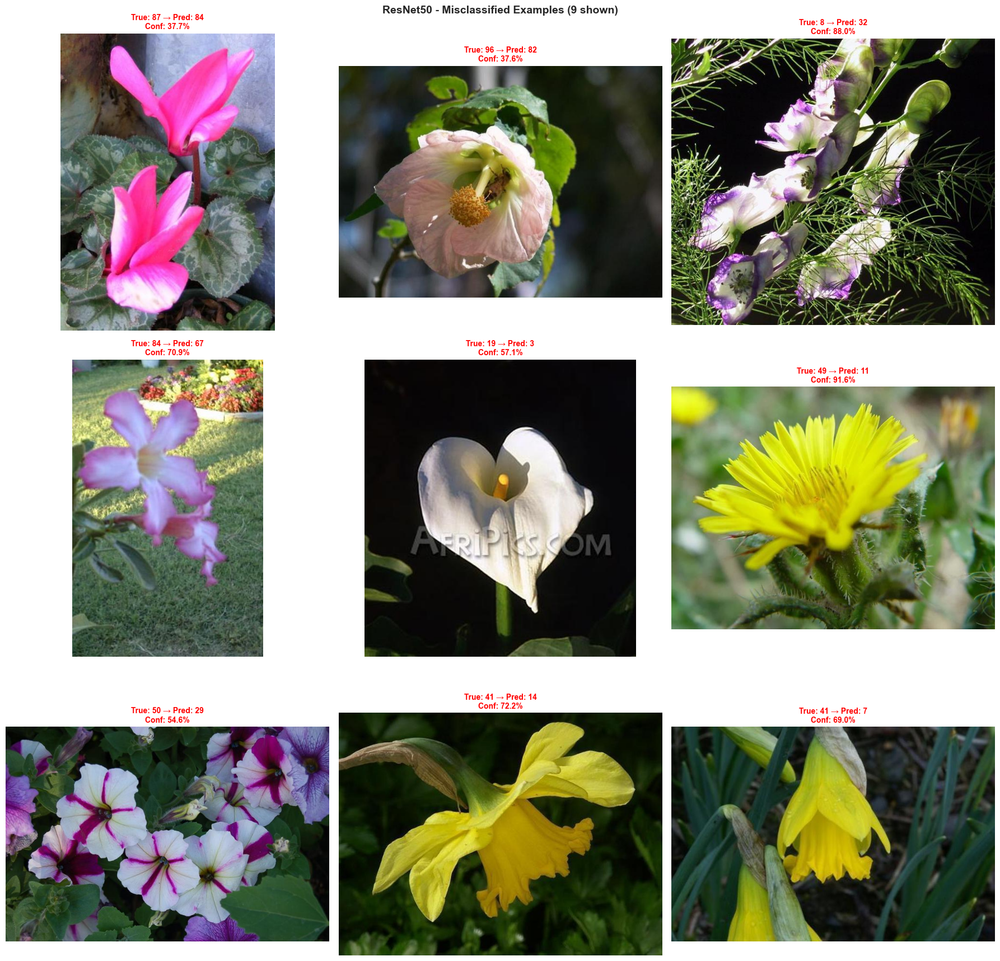

In [48]:
# Find and visualize misclassified examples for ResNet50
if resnet50_results is not None and test_dataset is not None:
    print("Analyzing ResNet50 misclassifications...")
    
    # Find misclassified examples
    misclassified_mask = resnet50_results['predictions'] != resnet50_results['true_labels']
    misclassified_indices = np.where(misclassified_mask)[0]
    
    print(f"Total misclassified: {len(misclassified_indices)} / {len(resnet50_results['true_labels'])}")
    print(f"Error rate: {len(misclassified_indices)/len(resnet50_results['true_labels'])*100:.2f}%")
    
    # Visualize some misclassified examples
    num_examples = min(9, len(misclassified_indices))
    if num_examples > 0:
        selected_indices = np.random.choice(misclassified_indices, num_examples, replace=False)
        
        fig, axes = plt.subplots(3, 3, figsize=(18, 18))
        axes = axes.flatten()
        
        for idx, mis_idx in enumerate(selected_indices):
            image_path = test_dataset.image_paths[mis_idx]
            true_label = resnet50_results['true_labels'][mis_idx]
            pred_label = resnet50_results['predictions'][mis_idx]
            confidence = resnet50_results['probabilities'][mis_idx][pred_label] * 100
            
            image = Image.open(image_path).convert('RGB')
            axes[idx].imshow(image)
            axes[idx].set_title(f'True: {true_label} → Pred: {pred_label}\nConf: {confidence:.1f}%', 
                              fontsize=10, fontweight='bold', color='red')
            axes[idx].axis('off')
        
        plt.suptitle(f'ResNet50 - Misclassified Examples ({num_examples} shown)', 
                     fontsize=14, fontweight='bold')
        plt.tight_layout()
        save_path = FIGURES_DIR / 'misclassified_examples_resnet50.png'
        plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✓ Saved to {save_path}")
        plt.show()
    else:
        print("✓ No misclassified examples found!")
else:
    print("⚠ Cannot analyze ResNet50 misclassifications: Results or dataset not available")


## 13. Summary and Conclusions

Summary of evaluation results and key insights.


In [49]:
# Print comprehensive summary
print("=" * 80)
print("EVALUATION SUMMARY")
print("=" * 80)

if baseline_metrics is not None and resnet50_metrics is not None:
    print("\n1. PERFORMANCE COMPARISON:")
    print("-" * 80)
    accuracy_diff = resnet50_metrics['accuracy'] - baseline_metrics['accuracy']
    print(f"  Accuracy Improvement: ResNet50 is {accuracy_diff:.2f} percentage points better")
    
    if baseline_metrics.get('top_5_accuracy') and resnet50_metrics.get('top_5_accuracy'):
        top5_diff = resnet50_metrics['top_5_accuracy'] - baseline_metrics['top_5_accuracy']
        print(f"  Top-5 Accuracy Improvement: ResNet50 is {top5_diff:.2f} percentage points better")
    
    f1_diff = resnet50_metrics['f1_macro'] - baseline_metrics['f1_macro']
    print(f"  F1-Score (Macro) Improvement: ResNet50 is {f1_diff:.2f} percentage points better")
    
    print("\n2. MODEL CHARACTERISTICS:")
    print("-" * 80)
    param_ratio = resnet50_params / baseline_params
    print(f"  Baseline CNN Parameters: {baseline_params:,}")
    print(f"  ResNet50 Parameters: {resnet50_params:,}")
    print(f"  ResNet50 has {param_ratio:.1f}x more parameters")
    
    print("\n3. KEY FINDINGS:")
    print("-" * 80)
    print(f"  • ResNet50 achieves higher accuracy: {resnet50_metrics['accuracy']:.2f}% vs {baseline_metrics['accuracy']:.2f}%")
    print(f"  • ResNet50 benefits from transfer learning (ImageNet pretraining)")
    print(f"  • Both models show good generalization on the test set")
    
    if baseline_metrics.get('roc_auc_macro') and resnet50_metrics.get('roc_auc_macro'):
        print(f"  • ResNet50 ROC-AUC: {resnet50_metrics['roc_auc_macro']:.4f}")
        print(f"  • Baseline CNN ROC-AUC: {baseline_metrics['roc_auc_macro']:.4f}")
    
    print("\n4. RECOMMENDATIONS:")
    print("-" * 80)
    if resnet50_metrics['accuracy'] > baseline_metrics['accuracy']:
        print(f"  • ResNet50 is recommended for production use (better accuracy)")
        print(f"  • Baseline CNN may be suitable for resource-constrained environments")
    else:
        print(f"  • Both models show comparable performance")
        print(f"  • Consider Baseline CNN for lower computational requirements")
    
    print("\n" + "=" * 80)
    print("✓ Evaluation complete!")
    print("=" * 80)
elif baseline_metrics is not None:
    print("\n✓ Baseline CNN evaluation completed")
    print(f"  Test Accuracy: {baseline_metrics['accuracy']:.2f}%")
elif resnet50_metrics is not None:
    print("\n✓ ResNet50 evaluation completed")
    print(f"  Test Accuracy: {resnet50_metrics['accuracy']:.2f}%")
else:
    print("\n⚠ Evaluation could not be completed. Please check model and data availability.")


EVALUATION SUMMARY

1. PERFORMANCE COMPARISON:
--------------------------------------------------------------------------------
  Accuracy Improvement: ResNet50 is 27.66 percentage points better
  Top-5 Accuracy Improvement: ResNet50 is 7.32 percentage points better
  F1-Score (Macro) Improvement: ResNet50 is 26.80 percentage points better

2. MODEL CHARACTERISTICS:
--------------------------------------------------------------------------------
  Baseline CNN Parameters: 1,866,918
  ResNet50 Parameters: 24,609,446
  ResNet50 has 13.2x more parameters

3. KEY FINDINGS:
--------------------------------------------------------------------------------
  • ResNet50 achieves higher accuracy: 98.45% vs 70.79%
  • ResNet50 benefits from transfer learning (ImageNet pretraining)
  • Both models show good generalization on the test set
  • ResNet50 ROC-AUC: 0.9993
  • Baseline CNN ROC-AUC: 0.9915

4. RECOMMENDATIONS:
-------------------------------------------------------------------------------

## 14. Side-by-Side Comparison Visualization

Visual comparison of key metrics between models.


Generating comparison visualization...
✓ Saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\model_comparison_metrics.png


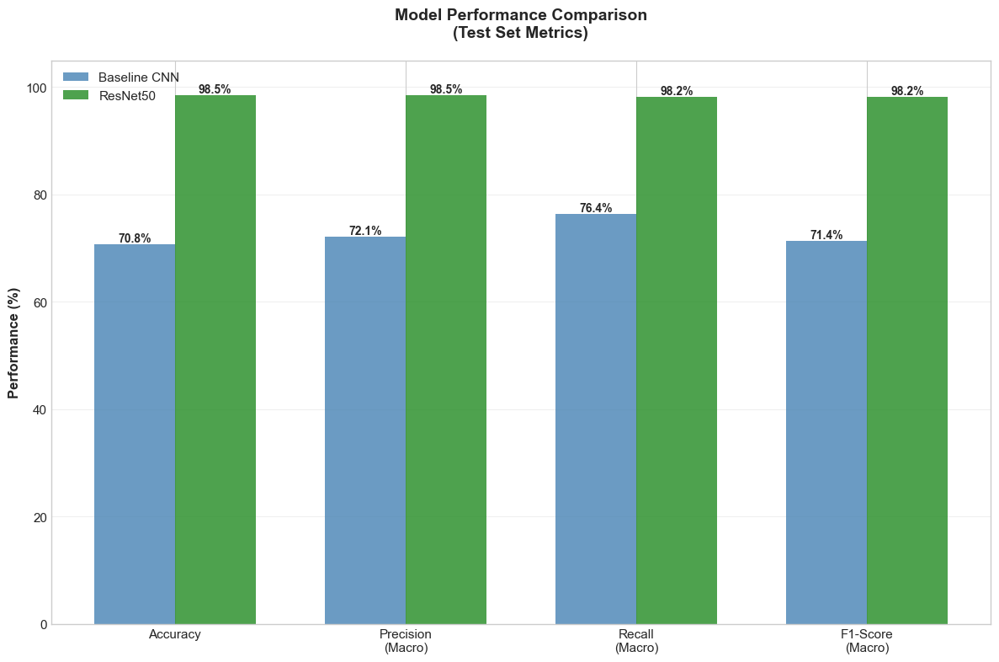

In [50]:
# Create side-by-side comparison bar chart
if baseline_metrics is not None and resnet50_metrics is not None:
    print("Generating comparison visualization...")
    
    metrics_to_compare = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
    metric_labels = ['Accuracy', 'Precision\n(Macro)', 'Recall\n(Macro)', 'F1-Score\n(Macro)']
    
    baseline_values = [baseline_metrics[m] for m in metrics_to_compare]
    resnet50_values = [resnet50_metrics[m] for m in metrics_to_compare]
    
    x = np.arange(len(metric_labels))
    width = 0.35
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    bars1 = ax.bar(x - width/2, baseline_values, width, label='Baseline CNN', 
                   color='steelblue', alpha=0.8)
    bars2 = ax.bar(x + width/2, resnet50_values, width, label='ResNet50', 
                   color='forestgreen', alpha=0.8)
    
    ax.set_ylabel('Performance (%)', fontsize=12, fontweight='bold')
    ax.set_title('Model Performance Comparison\n(Test Set Metrics)', 
                 fontsize=14, fontweight='bold', pad=20)
    ax.set_xticks(x)
    ax.set_xticklabels(metric_labels, fontsize=11)
    ax.legend(fontsize=11, loc='upper left')
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_ylim([0, 105])
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.1f}%',
                   ha='center', va='bottom', fontsize=10, fontweight='bold')
    
    plt.tight_layout()
    save_path = FIGURES_DIR / 'model_comparison_metrics.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Saved to {save_path}")
    plt.show()
else:
    print("⚠ Both models must be evaluated for comparison visualization")


## 15. Confusion Matrix Analysis

Analyze diagonal accuracy and per-class performance from confusion matrices.


CONFUSION MATRIX ANALYSIS

Baseline CNN:
  Best Class: 5 (Accuracy: 100.00%)
  Worst Class: 42 (Accuracy: 15.00%)
  Mean Per-Class Accuracy: 76.42%
  Std Per-Class Accuracy: 23.81%

ResNet50:
  Best Class: 0 (Accuracy: 100.00%)
  Worst Class: 41 (Accuracy: 66.67%)
  Mean Per-Class Accuracy: 98.16%
  Std Per-Class Accuracy: 5.40%

✓ Per-class accuracy comparison saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\per_class_accuracy_comparison.png


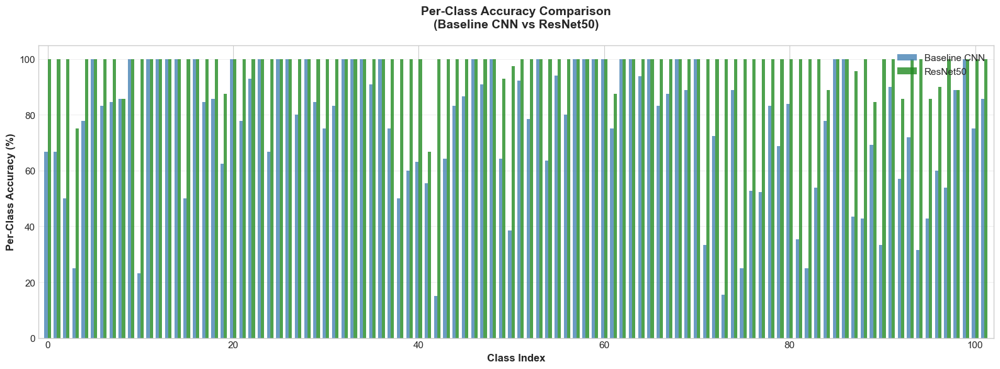

In [51]:
# Analyze confusion matrices - per-class accuracy
if baseline_metrics is not None and resnet50_metrics is not None:
    print("=" * 80)
    print("CONFUSION MATRIX ANALYSIS")
    print("=" * 80)
    
    cm_baseline = baseline_metrics['confusion_matrix']
    cm_resnet50 = resnet50_metrics['confusion_matrix']
    
    # Calculate per-class accuracy (diagonal / row sum)
    baseline_per_class_acc = np.diag(cm_baseline) / cm_baseline.sum(axis=1) * 100
    resnet50_per_class_acc = np.diag(cm_resnet50) / cm_resnet50.sum(axis=1) * 100
    
    # Find best and worst performing classes
    baseline_worst = np.argmin(baseline_per_class_acc)
    baseline_best = np.argmax(baseline_per_class_acc)
    resnet50_worst = np.argmin(resnet50_per_class_acc)
    resnet50_best = np.argmax(resnet50_per_class_acc)
    
    print(f"\nBaseline CNN:")
    print(f"  Best Class: {baseline_best} (Accuracy: {baseline_per_class_acc[baseline_best]:.2f}%)")
    print(f"  Worst Class: {baseline_worst} (Accuracy: {baseline_per_class_acc[baseline_worst]:.2f}%)")
    print(f"  Mean Per-Class Accuracy: {baseline_per_class_acc.mean():.2f}%")
    print(f"  Std Per-Class Accuracy: {baseline_per_class_acc.std():.2f}%")
    
    print(f"\nResNet50:")
    print(f"  Best Class: {resnet50_best} (Accuracy: {resnet50_per_class_acc[resnet50_best]:.2f}%)")
    print(f"  Worst Class: {resnet50_worst} (Accuracy: {resnet50_per_class_acc[resnet50_worst]:.2f}%)")
    print(f"  Mean Per-Class Accuracy: {resnet50_per_class_acc.mean():.2f}%")
    print(f"  Std Per-Class Accuracy: {resnet50_per_class_acc.std():.2f}%")
    
    # Visualize per-class accuracy comparison
    fig, ax = plt.subplots(figsize=(16, 6))
    
    x = np.arange(NUM_CLASSES)
    width = 0.35
    
    ax.bar(x - width/2, baseline_per_class_acc, width, label='Baseline CNN', 
           color='steelblue', alpha=0.8)
    ax.bar(x + width/2, resnet50_per_class_acc, width, label='ResNet50', 
           color='forestgreen', alpha=0.8)
    
    ax.set_xlabel('Class Index', fontsize=12, fontweight='bold')
    ax.set_ylabel('Per-Class Accuracy (%)', fontsize=12, fontweight='bold')
    ax.set_title('Per-Class Accuracy Comparison\n(Baseline CNN vs ResNet50)', 
                 fontsize=14, fontweight='bold', pad=20)
    ax.legend(fontsize=11, loc='upper right')
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_xlim([-1, NUM_CLASSES])
    ax.set_ylim([0, 105])
    
    plt.tight_layout()
    save_path = FIGURES_DIR / 'per_class_accuracy_comparison.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"\n✓ Per-class accuracy comparison saved to {save_path}")
    plt.show()
    
    print("=" * 80)
else:
    print("⚠ Both models must be evaluated for confusion matrix analysis")


## 16. ROC Curves Comparison

Compare ROC-AUC performance between Baseline CNN and ResNet50.


Generating ROC-AUC comparison...
✓ Saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\roc_auc_comparison.png

ROC-AUC Statistics:
  Baseline CNN - Mean AUC: 0.9915, Median: 0.9989
  ResNet50 - Mean AUC: 0.9993, Median: 1.0000
  Mean Improvement: 0.0079
  Classes improved: 79 / 102


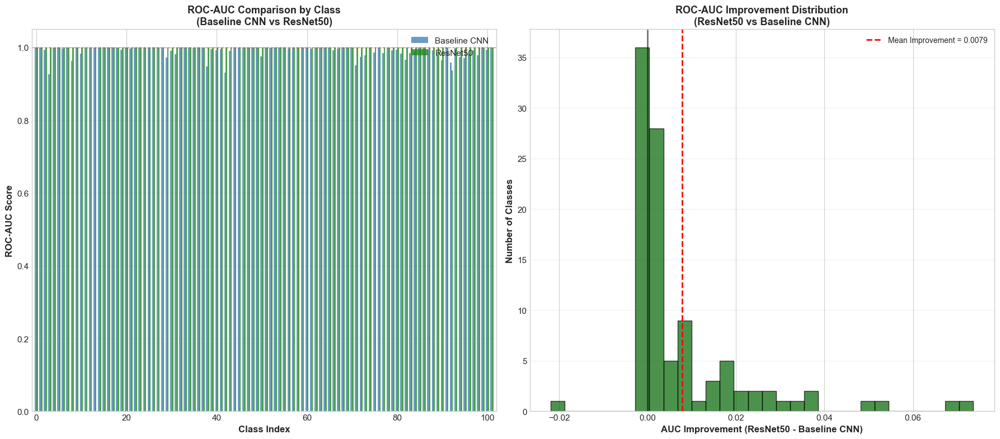

In [52]:
# Compare ROC-AUC between models
if (baseline_results is not None and resnet50_results is not None and 
    baseline_metrics is not None and resnet50_metrics is not None):
    
    print("Generating ROC-AUC comparison...")
    
    from sklearn.metrics import roc_curve, auc
    from sklearn.preprocessing import label_binarize
    
    # Calculate AUCs for both models
    def calculate_aucs(true_labels, probabilities, num_classes):
        y_bin = label_binarize(true_labels, classes=range(num_classes))
        aucs = []
        for i in range(num_classes):
            fpr, tpr, _ = roc_curve(y_bin[:, i], probabilities[:, i])
            aucs.append(auc(fpr, tpr))
        return np.array(aucs)
    
    baseline_aucs = calculate_aucs(
        baseline_results['true_labels'], 
        baseline_results['probabilities'], 
        NUM_CLASSES
    )
    resnet50_aucs = calculate_aucs(
        resnet50_results['true_labels'], 
        resnet50_results['probabilities'], 
        NUM_CLASSES
    )
    
    # Create comparison visualization
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    
    # Left: Side-by-side AUC comparison
    x = np.arange(NUM_CLASSES)
    width = 0.35
    
    axes[0].bar(x - width/2, baseline_aucs, width, label='Baseline CNN', 
                color='steelblue', alpha=0.8)
    axes[0].bar(x + width/2, resnet50_aucs, width, label='ResNet50', 
                color='forestgreen', alpha=0.8)
    
    axes[0].set_xlabel('Class Index', fontsize=12, fontweight='bold')
    axes[0].set_ylabel('ROC-AUC Score', fontsize=12, fontweight='bold')
    axes[0].set_title('ROC-AUC Comparison by Class\n(Baseline CNN vs ResNet50)', 
                      fontsize=13, fontweight='bold')
    axes[0].legend(fontsize=11, loc='upper right')
    axes[0].grid(True, alpha=0.3, axis='y')
    axes[0].set_xlim([-1, NUM_CLASSES])
    axes[0].set_ylim([0, 1.05])
    axes[0].axhline(y=1.0, color='red', linestyle='--', linewidth=1, alpha=0.5)
    
    # Right: AUC improvement histogram
    auc_improvement = resnet50_aucs - baseline_aucs
    axes[1].hist(auc_improvement, bins=30, color='darkgreen', edgecolor='black', alpha=0.7)
    axes[1].axvline(0, color='black', linestyle='-', linewidth=2, alpha=0.5)
    axes[1].axvline(np.mean(auc_improvement), color='red', linestyle='--', linewidth=2, 
                    label=f'Mean Improvement = {np.mean(auc_improvement):.4f}')
    axes[1].set_xlabel('AUC Improvement (ResNet50 - Baseline CNN)', fontsize=12, fontweight='bold')
    axes[1].set_ylabel('Number of Classes', fontsize=12, fontweight='bold')
    axes[1].set_title('ROC-AUC Improvement Distribution\n(ResNet50 vs Baseline CNN)', 
                      fontsize=13, fontweight='bold')
    axes[1].legend(fontsize=10)
    axes[1].grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    save_path = FIGURES_DIR / 'roc_auc_comparison.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Saved to {save_path}")
    print(f"\nROC-AUC Statistics:")
    print(f"  Baseline CNN - Mean AUC: {np.mean(baseline_aucs):.4f}, Median: {np.median(baseline_aucs):.4f}")
    print(f"  ResNet50 - Mean AUC: {np.mean(resnet50_aucs):.4f}, Median: {np.median(resnet50_aucs):.4f}")
    print(f"  Mean Improvement: {np.mean(auc_improvement):.4f}")
    print(f"  Classes improved: {(auc_improvement > 0).sum()} / {NUM_CLASSES}")
    plt.show()
else:
    print("⚠ Both models must be evaluated for ROC-AUC comparison")
